# End-To-End Multi-Class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using Tensorflow 2.0 and Tensorflow Hub.

## 1. Problem

Identifying the breed of a Dog given an image of a dog.

when i'm setting at the cafe and i take a photo of a dog, i want to know that breed of dog it is.

## 2. Data

The data we're using from Kaggle's dog breed identification competition. 
https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some imforamtion about the data: 

*   we're dealing with images(Unstructured Data) so it's probably bes we use   Deeeplearning/Tensorfer Learning. 
*   There are 120 breed of dogs(this means there are 120 different classes).
*   There are 10,000+ images in the training set( these images have labels).
*   There are around 10,0000+ images in the test set( these means images have no labes because we'll want to predict them).






In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# unzip Data in google drive
#!unzip "drive/My Drive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision/"

# Get our Workspace Ready

*   Import Tensorflow 2.x
*   Import Tensroflow Hub
*   Make sure we're using a GPU





In [2]:
# Import necessory tools
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL


from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
import tensorflow_hub as hub
import tensorflow as tf
print("Tensorflow Version:",tf.__version__)
print("Tensfolow Hub Version:",hub.__version__)

#Check for GPU Availability
print("GPU","available (Yeesssss!!!!)" if tf.config.list_physical_devices("GPU") else"not available:(")

Tensorflow Version: 2.3.0
Tensfolow Hub Version: 0.9.0
GPU available (Yeesssss!!!!)


## Getting our Data Ready (Turning into Tensors)

With all machine learning model's our data has to be in numerical format. so that's what we'll be doing first. Turning our images into Tensors (Numerical Representation)  

Let's start byaccessing our data and checking out the labels.

In [3]:
#Checkout the labels of our Data 
import pandas as pd
import os

In [4]:
labels_csv=pd.read_csv("drive/My Drive/Dog Vision/labels.csv")

In [5]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,c02707afcb697c42ee9e15028d5ef685,scottish_deerhound
freq,1,126


In [6]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


How Many Images are there of each class.... https://cloud.google.com/vision/automl/object-detection/docs/prepare

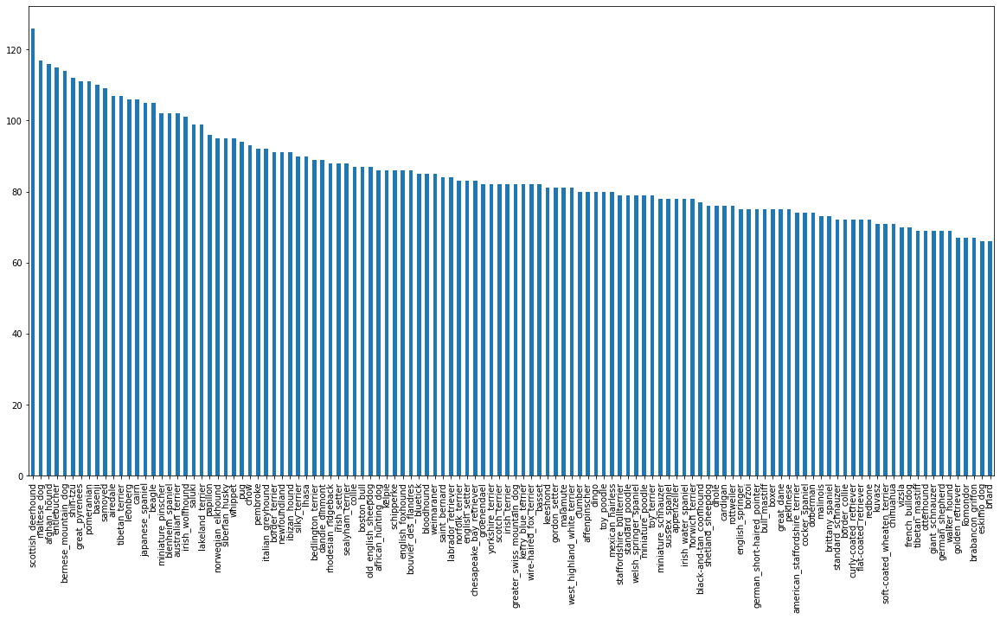

In [ ]:
# How many Images are there of each breed? ....
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


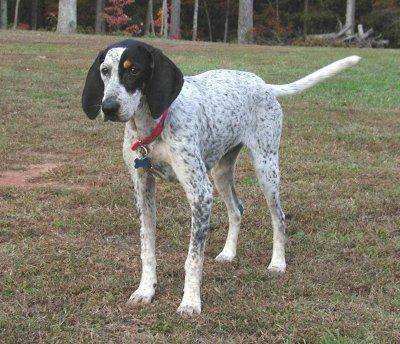

In [ ]:
## Let's view an image
from IPython.display import Image
Image("drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg")

## Getting Images and their labels 

let's get a list of our image file pathnames

In [7]:
# Create pathnames from image ID's
filenames=["drive/My Drive/Dog Vision/train/" + filenames + ".jpg" for filenames in labels_csv["id"]]

#Check the first 10
filenames[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [9]:
# Check wether number of filenames matches number of actual image file 
import os
if (len(os.listdir("drive/My Drive/Dog Vision/train/")))==len(filenames):
  print("Filenames match actual amount of files!!! Proceed")
else:
  print("Filenames do not match actual amount of files check the target directory")

Filenames match actual amount of files!!! Proceed


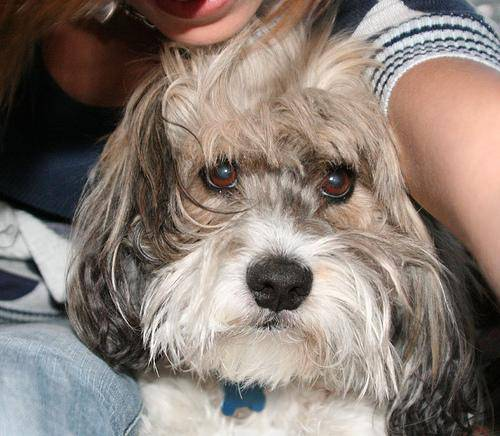

In [ ]:
# One more check
Image(filenames[900])

In [ ]:
labels_csv["breed"][900]

'lhasa'

In [10]:
# Let's Prepare our labels.
import numpy as np
labels=labels_csv["breed"]
labels

0                     boston_bull
1                           dingo
2                        pekinese
3                        bluetick
4                golden_retriever
                   ...           
10217                      borzoi
10218              dandie_dinmont
10219                    airedale
10220          miniature_pinscher
10221    chesapeake_bay_retriever
Name: breed, Length: 10222, dtype: object

In [ ]:
len(labels)

10222

In [11]:
import numpy as np
labels=labels_csv["breed"].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [12]:
# see if number of labels matchs the number of filenames
if (len(labels))==(len(filenames)):
  print("Number of labels matches number of filenames")
else:
  print("Number of labels does not mathces number of filenames, check data Directory")

Number of labels matches number of filenames


In [13]:
# Find the unique label values 
unique_breeds=np.unique(labels)
unique_breeds 

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [14]:
#Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [15]:
#Turn every label into a boolean array
boolean_labels=[label==unique_breeds for label in labels]

In [16]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) #Original Labels
print(np.where(unique_breeds==labels[0])) #Index where label occurs
print(boolean_labels[0].argmax()) #Index where label occurs in boolean array
print(boolean_labels[0].astype(int)) #There will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own Validation set
since the dataset from kaggle doesn't come with a validation set, we're going to create our own.

In [17]:
# Setup X & Y variables
X=filenames
Y=boolean_labels


we're going to stat off experimenting with ~1000 images and increase as needed.

In [18]:
#set Number of images to use for Experimenting
NUM_IMAGES=1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [20]:
#Let's split our Data into train and validation sets
from sklearn.model_selection import train_test_split
X_train,X_val,Y_train,Y_val=train_test_split(X[:NUM_IMAGES],
                                             Y[:NUM_IMAGES],
                                             test_size=0.2,
                                             random_state=42)
len(X_train),len(Y_train),len(X_val),len(Y_val)

(800, 800, 200, 200)

In [21]:
# Let's have a geez at the training Data
X_train[:5],Y_train[:2]

(['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

# Processing Images (Turning images into Tensors)
To process our images intoTensors we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable 'image'.
3. Turn our 'image' (a jpg) into Tensors
4. Normalize ourimage (Convert color channel values from 0-225 to 0-1)
5. Resize the 'image' to be a shape of (224,224).
6. Return the modified 'image'.

Tensorflow Data Loading...https://www.tensorflow.org/guide/data

Before we do, let's see what importing an image looks like.

In [22]:
from numpy import asarray

In [23]:
#Convert image to numpy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [24]:
image.max(),image.min()

(255, 0)

In [25]:
#Turn images into tensors
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

Now we've seen what an images look like as a tensor, let's make a function to preprocess them.

1. Take an image filepath as input
2. Use Tensorflow to read the file and save it to a variable 'image'.
3. Turn our 'image' (a jpg) into Tensors
4. Normalize ourimage (Convert color channel values from 0-225 to 0-1)
5. Resize the 'image' to be a shape of (224,224).
6. Return the modified 'image'.

In [26]:
# Define image size.
IMG_SIZE=224

#create a function for preprocessing images
def process_image(image,IMG_SIZE=IMG_SIZE):
  """""
  Takes an image file path and turns the image into tensor.
  """""
  #Read in an image file
  image=tf.io.read_file(image)

  #Turn the jpg image into numerical Tensor with 3 colour channels (Red,Blue,Green)
  image=tf.image.decode_jpeg(image,channels=3)

  #Convert the color channels vlaues from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image,tf.float32)

  #Resiz the image to our desired value (224,224)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image



In [ ]:
tensor=tf.io.read_file(filenames[26])

In [ ]:
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tf.image.decode_jpeg(tensor,channels=3)

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

# Turning our data into batches 

Why turn our data into batches?

Let's say your're trying to process 10,000+ images in one go... They all might no fit into memory.

so Thet's why we do about 32(this is the batch size) images at a time (you can manually adjust the batch size if need be).

 In order to use Tensorflow effectively, we need our data in the form of tensor tuples whichlook like this: (image,label)

In [27]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image,label):
  
  image=process_image(image)

  return image,label




In [ ]:
(process_image(X[42]),Y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

# Define the batches size 32 is a good start

In [28]:
BATCH_SIZE=32
""""
  Create batch of data out of Images (x) and labels (Y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
# Create a function to turn data into batches
def create_data_batches(X,Y=None, batch_size=BATCH_SIZE, vlaid_data=False, test_data=False):
  

  #if the data is a test dataset. we probably don't have labels.
  if test_data:
    print("Creating test data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))#Path
    data_batch=data.map(process_image).batch(BATCH_SIZE)

    return data_batch
  
  elif vlaid_data:
    print("Creating Validation Data Batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                            tf.constant(Y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    #If the data is training dataset,we shuffle it
    print("Creating training Data Batches...")
    #Turn filepaths and labels into Tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                             tf.constant(Y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data=data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data=data.map(get_image_label)

    #Turn data into batches
    data_batch=data.batch(BATCH_SIZE)

  return data_batch

# Create Training and validation data batches


In [29]:
train_data=create_data_batches(X_train,Y_train)
val_data=create_data_batches(X_val,Y_val, vlaid_data=True)

Creating training Data Batches...
Creating Validation Data Batches...


# Check out the different attributes of our data batches

In [30]:
train_data.element_spec,val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

But having our data in batches can be a bit of a hard concept to understand. Let's build a function which helps us visualize what's going on under the hood.

In [31]:
import matplotlib.pyplot as plt


In [32]:
# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")
    

In [33]:
train_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

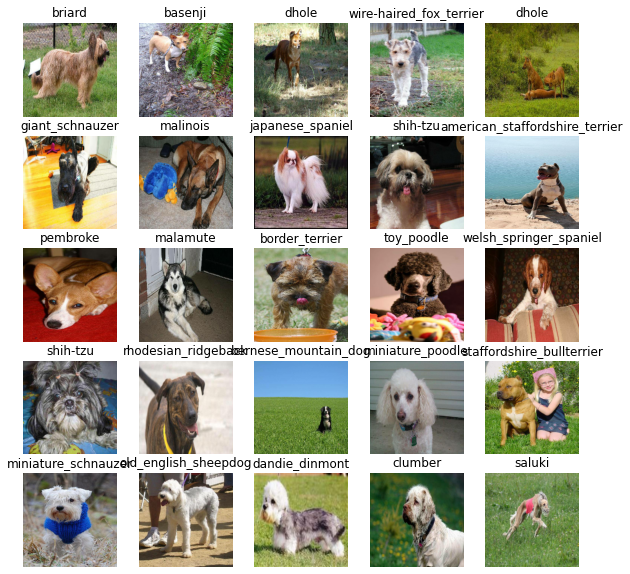

In [34]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

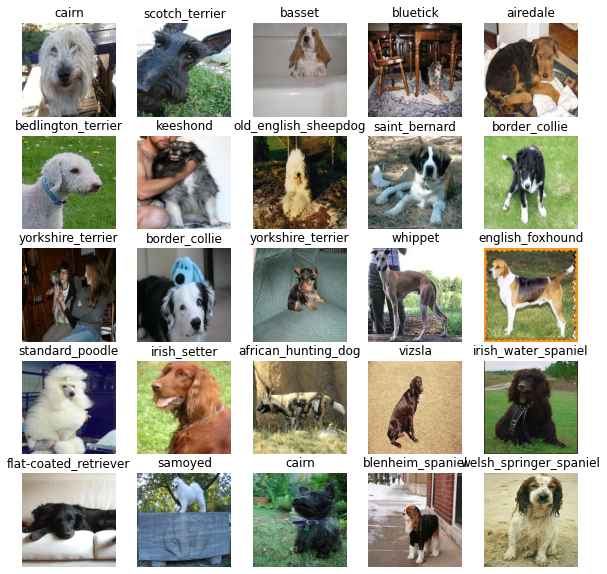

In [35]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a Model

Before we building a model, there are few things we need to define:


*   The input shape (Our images shape,in the form of Tensors) to our model.
*   The output shape (image labels in the form of Tensors) of our model.
*   The URL of the model we want to use.





In [36]:
IMG_SIZE

224

In [37]:
# Setup input shape of the model
INPUT_SHAPE= [None,IMG_SIZE,IMG_SIZE,3] #Batch,Hight,Width,Colour Channel.

#Setup Output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

#Setup Model URL From Tensorflow HUB
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

One of the best ways to get started is to use the Tensorflow Keras API which is the recent addition to Tensorflow 2.0

tf.Keras is the Tensorflow's High-Level API for building and training deep learning models.

Now we're got our inputs, outputs and model ready to go.

Let's put them together into Keras Deep Learning Model!

Knowing this, let's Create a Function Which:

*   Takes the input Shape, Output  shape and model we've chose as Parameters.
*   Define the layers in Keras model in sequential fashion (do this first, then this , then that).
*   Complies the model(says it should be eveluated and improved)
*   Builds the model (Tells the model the input shape it'll be getting).
*   Return the model.


All of these steps can be found here:https://www.tensorflow.org/guide/keras/sequential_model

In [38]:
#Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building Model with:",MODEL_URL)

  #setup the model layers
  model=tf.keras.Sequential([
                             hub.KerasLayer(MODEL_URL), # Layers 1 (Input Layers)
                             tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                   activation="softmax") #Layer 2 (output layer)
  ])

  #Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #Build the model
  model.build(INPUT_SHAPE)


  return model

In [ ]:
# the size of image 225 is not working in the updated version of MobileNetV2(24)

In [39]:
model=create_model()
model.summary()



Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


# Creating CallBacks

Callbacks are helper functions a modelcan use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for tensorBoard which helps track our model progress and another for early stoppig which prevents our model from training for too long.
 

# TensorBoard Callback

To setup a TensorBoard callback we need to do 3 things:

1) Load a TensorBoard notebook extension.

2) Create a TensorBoard CallBacks which is able to save logs to a directory and pass it to our model "fit()" Function.

3) Visualize our model training logs with the " % tensorboard " magic function( we'll do this after model training).

In [40]:
# Load TensorBoard Notebook extension
%load_ext tensorboard

In [41]:
import datetime

In [42]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/log",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

# Early Stopping CallBack

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create Early stopping Callback
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

# Training a Model (on Subset of Data)

our first model is only going to train on 1000 images, to make sure everything is working.

In [43]:
NUM_EPOCHS= 100 #@param {type:"slider", max:100, min:10, step:10}

In [44]:
# Check to make sure we're Still running on a GPU
print("GPU","Available (YESSS!)"if tf.config.list_physical_devices("GPU")else "Not Available :(") 

GPU Available (YESSS!)


Let's Create a function which trains a model.

*   Create a model using "create_model()" 
*   Setup a TensorBoard callBack using "create_tensorboard_callbacl()"
*   Call the "fit()" function on our model passing it the training data validation data, number of epochs to train for ("NUM_EPOCHS") and the callbacks we'd like to use.
*   Return the model.





In [45]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  
  return model

In [ ]:
#Fit the model to the data
model=train_model()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
 1/25 [>.............................] - ETA: 0s - loss: 5.8212 - accuracy: 0.0000e+00WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/ops/summary_ops_v2.py:1277: stop (from tensorflow.python.eager.profiler) is deprecated and will be removed after 2020-07-01.
Instructions for updating:
use `tf.profiler.experimental.stop` instead.


Instructions for updating:
use `tf.profiler.experimental.stop` instead.


25/25 [==============================] - 400s 16s/step - loss: 4.5353 - accuracy: 0.1063 - val_loss: 3.2648 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 6s 225ms/step - loss: 1.5886 - accuracy: 0.7025 - val_loss: 2.1672 - val_accuracy: 0.5100
Epoch 3/100
25/25 [==============================] - 6s 223ms/step - loss: 0.5581 - accuracy: 0.9375 - val_loss: 1.6984 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 6s 221ms/step - loss: 0.2481 - accuracy: 0.9900 - val_loss: 1.5085 - val_accuracy: 0.6350
Epoch 5/100
25/25 [==============================] - 6s 221ms/step - loss: 0.1428 - accuracy: 0.9987 - val_loss: 1.4508 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 6s 221ms/step - loss: 0.0985 - accuracy: 1.0000 - val_loss: 1.3973 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================] - 6s 223ms/step - loss: 0.0741 - accuracy: 1.0000 - val_loss: 1.3719 - val_accuracy: 0.6500
Epoch 8/100

**Question**: It look like our model is overfitting because it's performaing far better on the training than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note**: Overfitting to being with is a good things! It means our model is learning!!!

### Checking the TensorBoard Logs

The TensorBoard magic function ('%tensorboard') will access the logs directory we created earlier and visualiza its content

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/log

<IPython.core.display.Javascript object>

##Making and evaluating predictions using a trained model


In [ ]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [54]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 1s 106ms/step


array([[3.7526481e-03, 5.5456348e-04, 1.7533164e-03, ..., 9.4714615e-04,
        1.1376685e-05, 3.0424560e-03],
       [6.0979398e-03, 9.7836589e-04, 4.3655653e-03, ..., 8.0068654e-04,
        2.0837476e-03, 1.6902921e-03],
       [1.3512782e-04, 5.8806298e-04, 2.3276105e-05, ..., 2.0911489e-04,
        9.7742006e-05, 6.4690638e-04],
       ...,
       [9.3026092e-06, 6.6780811e-04, 8.6244318e-04, ..., 1.2439982e-05,
        6.0153339e-04, 4.7688744e-05],
       [4.2221677e-03, 1.1274319e-03, 4.0520361e-05, ..., 1.6295932e-04,
        3.2745240e-05, 1.9324388e-02],
       [1.1074024e-03, 7.9521096e-06, 2.5146030e-04, ..., 7.1381992e-03,
        6.3823193e-04, 1.4966422e-05]], dtype=float32)

In [55]:
predictions[0]

array([3.75264813e-03, 5.54563478e-04, 1.75331638e-03, 1.20600234e-04,
       4.35685739e-04, 4.87407960e-05, 3.46549191e-02, 2.55465362e-04,
       3.35364748e-04, 7.49765371e-04, 8.35193030e-04, 4.15067734e-05,
       3.35945108e-04, 7.44394711e-05, 3.94432951e-04, 3.03697831e-04,
       8.41392757e-05, 6.81559071e-02, 3.07765149e-05, 9.62376798e-05,
       9.38456214e-04, 1.84030505e-04, 4.16112853e-05, 9.80777433e-04,
       7.06920400e-05, 1.43509393e-03, 1.95804030e-01, 2.76020495e-04,
       5.67132083e-04, 4.53992398e-04, 3.73486866e-04, 1.16743485e-03,
       5.10605564e-03, 7.78224930e-05, 3.66719265e-04, 3.76921184e-02,
       1.30939588e-05, 7.54648761e-04, 3.14775862e-05, 4.34933114e-04,
       2.10908218e-03, 3.72504910e-05, 6.74546580e-04, 1.61764480e-03,
       2.24936575e-05, 1.12264250e-04, 1.56669339e-05, 7.93209416e-04,
       1.54457393e-03, 1.35523384e-04, 1.99124520e-03, 3.83084916e-05,
       4.44702775e-04, 2.30588441e-04, 2.71847210e-04, 6.35723482e-05,
      

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[0.00985839 0.00040544 0.00063011 0.00176929 0.00133568 0.00261862
 0.01012358 0.01194635 0.00175215 0.01026965 0.00830112 0.00272303
 0.00880535 0.0042874  0.00223457 0.00419643 0.00390502 0.00057725
 0.02542937 0.0024208  0.02162819 0.00044013 0.07620654 0.00817535
 0.00368927 0.00212523 0.00432479 0.00070894 0.00172748 0.08623701
 0.00649957 0.00240305 0.00079988 0.00795148 0.00794284 0.0017484
 0.00118938 0.01316269 0.00796278 0.00864928 0.00066171 0.00129395
 0.00475329 0.01332133 0.00405063 0.00587028 0.0070506  0.00061381
 0.05812589 0.00230993 0.00400829 0.00774834 0.00747188 0.00089649
 0.00050147 0.00603126 0.01638596 0.06199484 0.00050359 0.00491823
 0.00098152 0.00193866 0.00486574 0.00233215 0.00721107 0.00108943
 0.01576761 0.00201554 0.00198205 0.02514138 0.0011502  0.01367059
 0.00654812 0.00645024 0.03019764 0.01550914 0.00078326 0.0100241
 0.00271967 0.00143027 0.00550073 0.00272207 0.01142424 0.00150938
 0.05162264 0.00476617 0.00131801 0.00175748 0.00318379 0.012139

In [ ]:
unique_breeds[113]

'walker_hound'

Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [56]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an arry of prediction probabilities into label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of predictions probabilities 
pred_label=get_pred_label(predictions[81])
pred_label

'dingo'

In [57]:
val_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels)....https://www.tensorflow.org/api_docs/python/tf/data/Dataset#unbatch

In [58]:
#Without function 
images_=[]
labels_=[]
#Loop through unbatch data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [59]:
get_pred_label(labels_[42])

'english_foxhound'

In [60]:
get_pred_label(predictions[42])

'walker_hound'

In [61]:
# Create a function to unbatch a batch dataset.
def unbatchify(data):
  """
  Takes a batched dataset of (image,label) Tensors and returns separate arrays of images and labels
  """
  images=[]
  labels=[]
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(
    unique_breeds[np.argmax(label)])
  return images , labels


# Unbatchify the validation data
val_images, val_labels= unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [62]:
get_pred_label(val_labels[0])

'affenpinscher'

Now we've got ways to get get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visaulize.

We'll create a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. 
* Convert the prediction probabilities to a predicted label. 
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. 

In [63]:
def plot_pred(prediction_probabilities,labels, images, n=1):
  """
  View the Prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  #Get the pred label 
  pred_label = get_pred_label(pred_prob)

  #Plot image & Remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  #Change plot title to be predicted, probability of Prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color) 

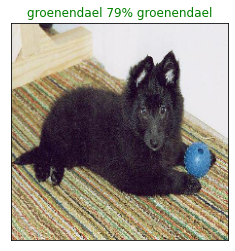

In [64]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

Now we've got one function to visualize our models top Predictions, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer.
* Find the prediction using 'get_pred_label()'
* Find the Top 10:
  * Prediction Probabilities indexes 
  * Prediction Probabilities Values
  * Prediction labels 
* Plot the Top 10 prediction probability Values and labels, coloring the true label green  

In [65]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the Top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label= prediction_probabilities[n], labels[n]

  #Get the predicted label
  pred_label = get_pred_label(pred_prob)

  #Find the top 10 prediction confidence indexs
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  #Find the top 10 prediction confidence valeus
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  #Find the top 10 prediciton labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  #Setup Plot 
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  #Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass 

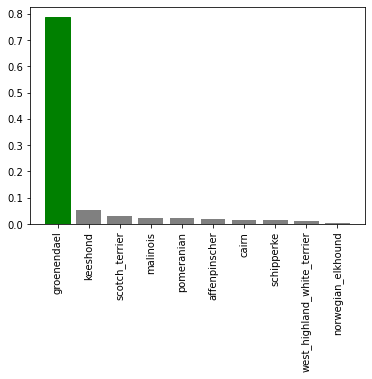

In [66]:
plot_pred_conf(prediction_probabilities=predictions, 
               labels=val_labels, 
               n=77)

Now we've got some function to help us visualize our prediction and evaluate our model, let's check out a few. 

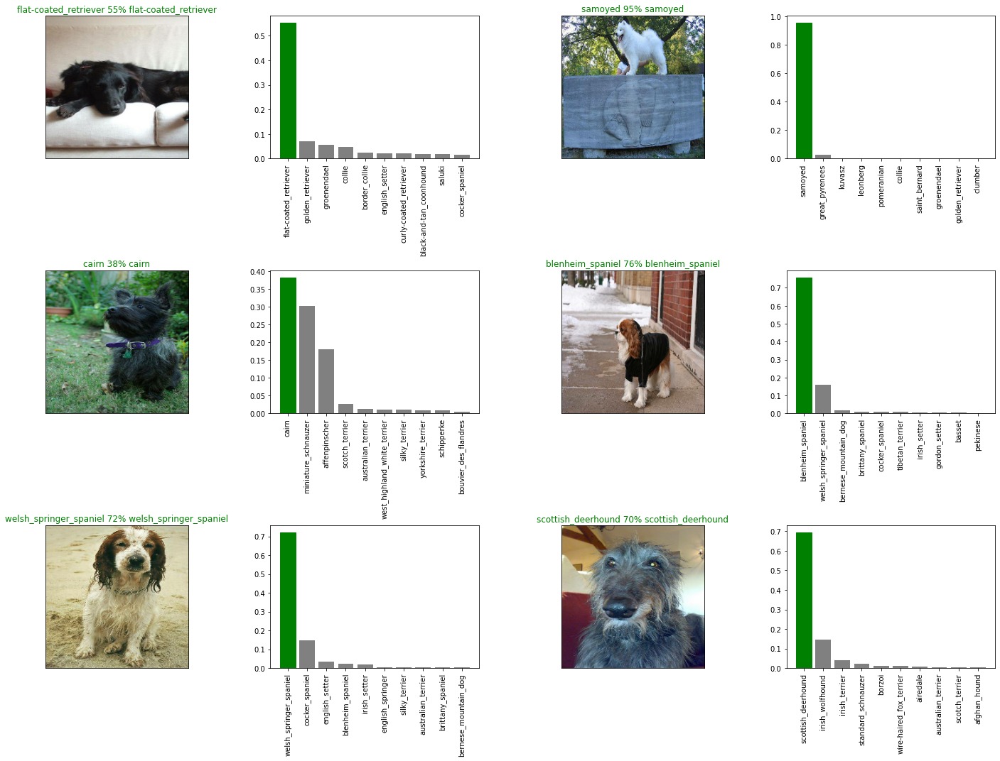

In [67]:
#Let's check out a few predictions and their different values 
i_multiplier = 20
num_rows = 3
num_cols = 2 
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
  
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and Reloading a Trained ....https://www.tensorflow.org/tutorials/keras/save_and_load

In [48]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir=os.path.join("drive/My Drive/Dog Vision/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir + "-" + suffix + ".h5" # save formate of model
  print(f"Saving model to:{model_path}... ")
  model.save(model_path)
  return model_path

In [49]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from:{model_path}...")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model

Now we've got functions to save and load a trined model, let's make sure they work!

In [ ]:
#Save out model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to:drive/My Drive/Dog Vision/models/20200924-08431600936990-1000-images-mobilenetv2-Adam.h5... 


'drive/My Drive/Dog Vision/models/20200924-08431600936990-1000-images-mobilenetv2-Adam.h5'

In [50]:
#Load a trained model
loaded_1000_image_model = load_model("drive/My Drive/Dog Vision/models/20200916-15481600271293-1000-images-mobilenetv2-Adam.h5")

Loading saved model from:drive/My Drive/Dog Vision/models/20200916-15481600271293-1000-images-mobilenetv2-Adam.h5...


In [52]:
model=loaded_1000_image_model

In [53]:
model.evaluate(val_data)

7/7 [==============================] - 65s 9s/step - loss: 1.2472 - accuracy: 0.6500


[1.2471537590026855, 0.6499999761581421]

In [ ]:
#Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 141ms/step - loss: 1.2472 - accuracy: 0.6500


[1.247153878211975, 0.6499999761581421]

## Training a big dog model (on the full data)

In [68]:
len(X), len(Y)

(10222, 10222)

In [69]:
len(X_train)

800

In [70]:
X[:10]

['drive/My Drive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [71]:
X_train[:10]

['drive/My Drive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/My Drive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/My Drive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/My Drive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/My Drive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg',
 'drive/My Drive/Dog Vision/train/0ea5759640f2e1c2d1a06adaf8a54ca7.jpg',
 'drive/My Drive/Dog Vision/train/03e1d2ee5fd90aef036c90a9e7f81177.jpg',
 'drive/My Drive/Dog Vision/train/16941a6728ddb9cb7423a6cc97fbe071.jpg',
 'drive/My Drive/Dog Vision/train/0bedbecd92390ef9f4f7c8b06a629340.jpg',
 'drive/My Drive/Dog Vision/train/143b9484273e57668d03bfc26755810a.jpg']

In [72]:
#Create a data batch with the full data set
full_data = create_data_batches(X,Y)

Creating training Data Batches...


In [73]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [74]:
full_model = create_model()

Building Model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [75]:
# Create full model Callbacks
full_model_tensorboard = create_tensorboard_callback()
# No Validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)  

**Note:** Running the cell blow will take a little while (maybe up to 30 minutes for the first epochs) because the GPU we're using in the runtime has to load all of the images into mamory. 

In [ ]:
# Fit the full model to the full data 
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 4205s 13s/step - loss: 1.3197 - accuracy: 0.6763
Epoch 2/100
320/320 [==============================] - 58s 180ms/step - loss: 0.4023 - accuracy: 0.8811
Epoch 3/100
320/320 [==============================] - 57s 177ms/step - loss: 0.2405 - accuracy: 0.9322
Epoch 4/100
320/320 [==============================] - 57s 177ms/step - loss: 0.1518 - accuracy: 0.9650
Epoch 5/100
320/320 [==============================] - 56s 176ms/step - loss: 0.1058 - accuracy: 0.9792
Epoch 6/100
320/320 [==============================] - 56s 176ms/step - loss: 0.0779 - accuracy: 0.9868
Epoch 7/100
320/320 [==============================] - 57s 178ms/step - loss: 0.0576 - accuracy: 0.9915
Epoch 8/100
320/320 [==============================] - 57s 180ms/step - loss: 0.0472 - accuracy: 0.9938
Epoch 9/100
320/320 [==============================] - 57s 179ms/step - loss: 0.0375 - accuracy: 0.9953
Epoch 10/100
320/320 [==============================] - 57s 177m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to:drive/My Drive/Dog Vision/models/20200924-10091600942197-full-image-set-mobilenetv2-Adam.h5... 


'drive/My Drive/Dog Vision/models/20200924-10091600942197-full-image-set-mobilenetv2-Adam.h5'

In [76]:
loaded_full_model = load_model("drive/My Drive/Dog Vision/models/20200916-21241600291456-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from:drive/My Drive/Dog Vision/models/20200916-21241600291456-full-image-set-mobilenetv2-Adam.h5...


## Making predictions on the test dataset

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames. 
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels). 
* Make a predictions array by passing the test batches to the `predict()` method called on our model. 

In [78]:
# Load test image filenames
import os
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [79]:
len(test_filenames)

10366

In [80]:
# Create data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [81]:
#Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

  1/324 [..............................] - ETA: 0s

KeyboardInterrupt: ignored

In [ ]:
# Save predictins (Numpy Array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/predis1_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load Predictions (Numpy Array) from csv file
test_predictions= np.loadtxt("drive/My Drive/Dog Vision/predi_array.csv", delimiter=",") 

In [ ]:
test_predictions[:10]

array([[1.20113284e-04, 4.94816348e-08, 7.84593368e-09, ...,
        7.33932097e-08, 2.33564015e-06, 9.85321701e-01],
       [7.66128316e-09, 3.77254929e-11, 9.50051060e-09, ...,
        2.60907029e-07, 1.05023728e-05, 2.56950106e-08],
       [1.02647043e-07, 2.15065507e-10, 6.03436638e-06, ...,
        1.25404809e-09, 1.32001410e-09, 4.06609274e-07],
       ...,
       [6.87994957e-01, 2.75592504e-09, 5.22689731e-08, ...,
        6.32771335e-10, 2.88643349e-07, 1.91787243e-04],
       [6.55924879e-08, 6.99797331e-09, 8.38962233e-10, ...,
        8.78881135e-10, 5.45030787e-07, 6.23530848e-03],
       [3.25192133e-07, 1.54911722e-05, 7.08981952e-06, ...,
        1.24937105e-05, 1.94974392e-09, 1.84826874e-07]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed. 
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilites) to each of the dog breed columns.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [ ]:
# ["id"] + list(unique_breeds)

In [ ]:
preds_df = pd.DataFrame(columns= ["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7e9dd51302fe08c1c89a550e183cf07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e7b4b0e7d7d76f8dbd64920f34443b25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7ce78e874945f182a4f5149aa505b09,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e7b608110b0e29120d8740f37e85f3d0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e800b6c8d2904e205d67ada800907762,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7e9dd51302fe08c1c89a550e183cf07,0.000120113,4.94816e-08,7.84593e-09,2.99921e-07,4.49546e-07,4.43845e-09,0.00883025,1.55153e-07,3.63212e-09,1.12277e-08,7.07874e-10,4.264e-07,7.23483e-09,5.27881e-08,1.75968e-10,2.19461e-08,4.56857e-07,2.96013e-07,3.30007e-09,9.75454e-08,4.43724e-09,1.33879e-07,6.49894e-07,1.36317e-08,1.71677e-09,5.43152e-10,8.137e-06,7.30948e-09,1.68608e-09,8.55806e-06,2.35394e-09,7.37676e-09,1.34225e-09,1.69008e-08,1.3158e-10,1.54357e-09,1.5945e-09,5.39861e-09,6.4975e-07,...,1.24691e-08,4.05432e-08,3.11575e-11,1.2285e-08,0.000290961,1.90444e-06,3.59036e-08,0.00320464,2.7669e-08,5.80941e-10,1.92638e-10,1.59257e-08,1.69257e-10,1.22296e-08,2.1396e-07,7.45669e-07,9.42123e-09,2.13036e-06,3.99095e-08,5.88027e-08,1.12109e-05,2.05794e-11,0.000878483,5.01564e-09,1.61117e-08,3.25538e-11,1.01809e-07,4.15471e-07,1.2566e-11,2.32979e-06,1.07296e-07,0.00116026,1.96013e-08,3.13815e-09,1.02494e-08,2.50387e-09,8.00538e-06,7.33932e-08,2.33564e-06,0.985322
1,e7b4b0e7d7d76f8dbd64920f34443b25,7.66128e-09,3.77255e-11,9.50051e-09,1.54788e-07,0.000166094,4.41344e-09,6.4285e-09,1.37359e-10,1.26393e-07,5.88279e-07,4.61549e-07,1.79166e-10,0.000103131,2.79626e-09,0.000489138,3.04249e-06,6.57987e-08,2.73619e-08,2.06397e-09,1.00053e-07,1.75883e-08,1.16319e-07,1.66545e-07,3.99762e-08,5.53602e-06,2.90166e-07,1.7142e-09,1.56084e-10,0.0160065,7.79928e-07,7.96641e-11,1.52117e-05,1.60358e-08,7.00174e-08,3.54917e-05,6.88019e-09,2.46859e-07,6.1626e-07,8.47214e-05,...,5.45236e-09,5.02244e-09,1.54604e-07,2.72377e-05,8.60684e-10,5.28637e-10,4.05437e-09,4.75406e-10,5.16041e-07,9.91552e-06,0.006208,9.44273e-06,4.62481e-09,6.59746e-09,6.37241e-09,1.97831e-06,4.00228e-10,3.88218e-05,1.06682e-07,1.55066e-09,8.05614e-09,5.90261e-06,2.65382e-08,3.67279e-06,0.000318879,1.94802e-05,8.94509e-08,1.65591e-05,1.2221e-08,2.20729e-08,7.4545e-10,4.58544e-09,0.667934,0.000932514,0.0280749,1.6439e-09,5.09486e-10,2.60907e-07,1.05024e-05,2.5695e-08
2,e7ce78e874945f182a4f5149aa505b09,1.02647e-07,2.15066e-10,6.03437e-06,2.16459e-13,2.31718e-09,4.75218e-08,1.76929e-08,1.93985e-08,1.06709e-11,7.74022e-12,8.16509e-10,4.45244e-09,2.4192e-09,1.17952e-10,2.47475e-08,2.4316e-10,7.04348e-07,6.46435e-10,2.34486e-11,3.33741e-07,1.85552e-09,3.98305e-12,2.12747e-07,6.91923e-09,2.41612e-08,2.50825e-11,2.76462e-10,4.18662e-07,1.24081e-08,1.21075e-05,1.62849e-08,5.88554e-08,2.98354e-09,3.3487e-07,6.8962e-07,2.14132e-08,4.00732e-07,1.08657e-06,3.52973e-09,...,6.79452e-06,4.7808e-07,9.10783e-12,9.89333e-10,5.56562e-06,2.58596e-11,4.98205e-08,7.34341e-07,9.87878e-09,7.10595e-08,1.42288e-11,1.05459e-09,1.73222e-10,1.5374e-10,1.52981e-08,0.501607,2.4639e-06,4.63209e-08,6.43152e-09,9.07502e-09,1.55384e-08,4.92885e-07,1.02474e-10,4.35547e-09,8.02006e-07,1.01742e-07,1.7931e-09,1.44585e-06,8.03008e-07,5.96029e-09,1.7006e-07,9.15374e-09,7.087e-09,2.98319e-11,6.41367e-09,8.42951e-11,4.5471e-09,1.25405e-09,1.3

In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Vision/predictions_submission_mobilenetV2_version1.csv",
                index=False)

## Making Predictions on custom images 
To Make Predictions on Custom images, well'll


*   Get the filepaths of our own images.

*   Turn the filepath into data batches using 'create_data_batches()'. And Science our custom images won't have labels, we set the 'test_data parameter to 'True'.

*   Pass the custom image data batche to our model's  'predict()' method.
*   Convert the prediction output probabilities to predictions labels.
*   Compare the predicted labels to the custom images.









In [83]:
#Get custom image filepaths
custom_path= "drive/My Drive/Dog Vision/custom-images/"
custom_image_path=[custom_path + fname for fname in os.listdir(custom_path )]

In [84]:
custom_image_path

['drive/My Drive/Dog Vision/custom-images/Afghan-Hound-Dog-Breed-Profile.jpg',
 'drive/My Drive/Dog Vision/custom-images/dog-4372036__340.jpg',
 'drive/My Drive/Dog Vision/custom-images/Affenpinscher-dog-breed-info.jpg',
 'drive/My Drive/Dog Vision/custom-images/Affenpinscher.jpg',
 'drive/My Drive/Dog Vision/custom-images/Airdale.jpg']

In [85]:
#Turn custom images into batch Datasets
custom_data = create_data_batches(custom_image_path, test_data=True)
custom_data


Creating test data batches...


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [87]:
#Make Predictions on the custom Data
custom_preds = loaded_full_model.predict(custom_data)

In [88]:
custom_preds

array([[5.01297137e-14, 9.99979258e-01, 3.50111919e-11, 1.43285855e-10,
        2.36235198e-11, 1.33493439e-10, 6.54867165e-13, 4.87534188e-12,
        3.52615645e-11, 5.12406483e-14, 1.62215269e-10, 3.40137474e-09,
        6.56073729e-09, 3.15404214e-09, 7.66479502e-09, 1.05191744e-09,
        2.49642950e-12, 3.61350858e-12, 3.96129963e-07, 1.05742780e-12,
        2.63160639e-11, 8.33682290e-11, 7.88008461e-12, 1.23703858e-09,
        1.48282896e-11, 2.92060456e-08, 2.12425702e-11, 8.11807913e-11,
        5.38309120e-10, 1.55524790e-12, 9.03444874e-10, 3.70933795e-09,
        6.40976028e-09, 2.85908129e-07, 2.56204141e-10, 9.26475702e-11,
        2.37607573e-11, 3.13702009e-10, 7.64988251e-09, 2.28006499e-07,
        1.69226066e-09, 1.88962006e-11, 1.38814267e-08, 2.51121735e-10,
        5.22142274e-10, 1.18112135e-11, 6.00992367e-10, 1.94421493e-11,
        1.30613584e-11, 5.49756919e-07, 2.63006505e-08, 1.28745441e-07,
        9.52774099e-06, 2.23918852e-13, 1.34699452e-09, 3.098237

In [89]:
custom_preds.shape

(5, 120)

In [90]:
# Get custom image prediction labels
custom_preds_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds_labels

['afghan_hound',
 'golden_retriever',
 'affenpinscher',
 'affenpinscher',
 'airedale']

In [91]:
# Get custom images (our unbatchify() function won't work since there aren't labels... )
custom_images = []
# Loop through unbatched data 
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

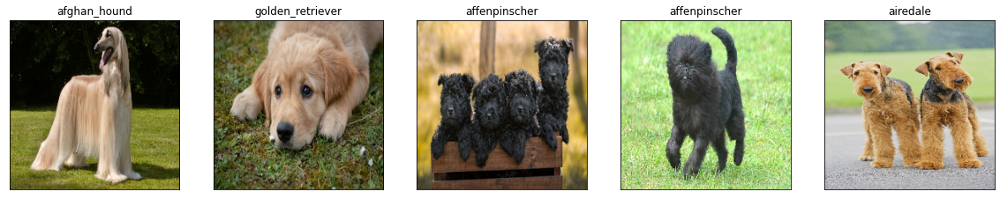

In [95]:
# Check custom image predictions
plt.figure(figsize=(20,20))
for i, image in enumerate(custom_images):
  plt.subplot(1 , 5, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_labels[i])
  plt.imshow(image)

In [1]:
#tf.keras.models.save_model(model2,"Dog_vision.hdf5")

In [2]:
#!pip install streamlit

%%writefile app.py
import streamlit as st
import tensorflow as tf

st.set_option("deprecation.showfileUploaderEncoding",False)
@st.cache(allow_output_mutation=True)
def load_model():
  model=tf.keras.models.load_model("/content/Dog_vision.hdf5")
  return model

model=load_model()
st.write("""
        # Dog Vision
        """
)

file= st.file_uploader("Upload an Dog Image", type=["jpg","png"])
import cv2
from PIL import Image, ImageOps
import numpy as np

def import_and_predict(image_data, model):
  size = (224,224) 
  image = ImageOps.fit(image_data, size,Image.ANTIALIAS)
  img = np.asarray(image)
  img_reshape = img[np.newaxis,...]
  prediction = model.predict(img_reshape)

  return prediction

if file is None:
  st.text("Please upload an Image file") 
else:
  image= Image.open(file)
  st.image(image, use_column_width=True)
  predictions = import_and_predict(image, model)
  string = "This Image most likely is: "+unique_breeds[np.argmax(predictions)]
  st.success(string)